# Transfer Learning with TensorFlow Part 3: Scaling up

We've seen the power of transfer learning feature extraction and fine-tuning, now it's time to scale up to all the classes in Food101 (101 total classes of food)

Our goal is to beat the original Food101 paper with 10% of the training data (leveraging the power of deep learning)

Original Food101 paper: https://data.vision.ee.ethz.ch/cvl/datasets_extra/food-101/static/bossard_eccv14_food-101.pdf

Our baseline to beat is 50.76% accuracy across 101 classes

In [1]:
!nvidia-smi

Mon Jul 15 13:37:38 2024       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 556.12                 Driver Version: 556.12         CUDA Version: 12.5     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                  Driver-Model | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  NVIDIA GeForce GTX 1650      WDDM  |   00000000:01:00.0 Off |                  N/A |
| N/A   56C    P8              2W /   50W |     289MiB /   4096MiB |     24%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [2]:
# Creating helper functions

!wget https://raw.githubusercontent.com/mrdbourke/tensorflow-deep-learning/main/extras/helper_functions.py


--2024-07-15 13:37:38--  https://raw.githubusercontent.com/mrdbourke/tensorflow-deep-learning/main/extras/helper_functions.py
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 2606:50c0:8000::154, 2606:50c0:8001::154, 2606:50c0:8002::154, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|2606:50c0:8000::154|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 10246 (10K) [text/plain]
Saving to: 'helper_functions.py'

     0K ..........                                            100% 3.70M=0.003s

2024-07-15 13:37:39 (3.70 MB/s) - 'helper_functions.py' saved [10246/10246]



In [3]:
# import helper function

from helper_functions import create_tensorboard_callback, plot_loss_curves, unzip_data, compare_historys, walk_through_dir

In [4]:
## 101 Foood classes:
!wget https://storage.googleapis.com/ztm_tf_course/food_vision/101_food_classes_10_percent.zip
unzip_data("101_food_classes_10_percent.zip")

train_dir = "101_food_classes_10_percent/train/"
test_dir = "101_food_classes_10_percent/test/"

--2024-07-15 13:37:54--  https://storage.googleapis.com/ztm_tf_course/food_vision/101_food_classes_10_percent.zip
Resolving storage.googleapis.com (storage.googleapis.com)... 2404:6800:4009:82e::201b, 2404:6800:4009:832::201b, 2404:6800:4009:810::201b, ...
Connecting to storage.googleapis.com (storage.googleapis.com)|2404:6800:4009:82e::201b|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1625420029 (1.5G) [application/zip]
Saving to: '101_food_classes_10_percent.zip'

     0K .......... .......... .......... .......... ..........  0%  120K 3h41m
    50K .......... .......... .......... .......... ..........  0%  170K 3h8m
   100K .......... .......... .......... .......... ..........  0%  460K 2h24m
   150K .......... .......... .......... .......... ..........  0%  443K 2h3m
   200K .......... .......... .......... .......... ..........  0%  517K 1h48m
   250K .......... .......... .......... .......... ..........  0%  708K 97m2s
   300K .......... .........

In [5]:
walk_through_dir("101_food_classes_10_percent")

There are 2 directories and 0 images in '101_food_classes_10_percent'.
There are 101 directories and 0 images in '101_food_classes_10_percent\test'.
There are 0 directories and 250 images in '101_food_classes_10_percent\test\apple_pie'.
There are 0 directories and 250 images in '101_food_classes_10_percent\test\baby_back_ribs'.
There are 0 directories and 250 images in '101_food_classes_10_percent\test\baklava'.
There are 0 directories and 250 images in '101_food_classes_10_percent\test\beef_carpaccio'.
There are 0 directories and 250 images in '101_food_classes_10_percent\test\beef_tartare'.
There are 0 directories and 250 images in '101_food_classes_10_percent\test\beet_salad'.
There are 0 directories and 250 images in '101_food_classes_10_percent\test\beignets'.
There are 0 directories and 250 images in '101_food_classes_10_percent\test\bibimbap'.
There are 0 directories and 250 images in '101_food_classes_10_percent\test\bread_pudding'.
There are 0 directories and 250 images in '10

In [6]:
# Setup data inputs
import tensorflow as tf
IMG_SIZE = (224, 224)
train_data_all_10_percent = tf.keras.preprocessing.image_dataset_from_directory(train_dir,
                                                                                label_mode="categorical",
                                                                                image_size=IMG_SIZE)

test_data = tf.keras.preprocessing.image_dataset_from_directory(test_dir,
                                                                label_mode="categorical",
                                                                image_size=IMG_SIZE,
                                                                shuffle=False)

Found 7575 files belonging to 101 classes.
Found 25250 files belonging to 101 classes.


## Train a big dog model with transfer learning on 10% of 101 food classes

Here are the steps we are going to do

* Create a ModelCheckpoint callback
* Create a data augmentation layer to build data augmentation right into the model
* Build a headless (no top layers) Functional EfficientNetB0 backboned-model (we'll create our own output layer)
* Compile our model
* Feature extract for 5 full passes (5 full epochs on the train dataset and validate on 15% of the test data, to save epoch time)

In [7]:
# Create checkpoint callback
checkpoint_path = "101_food_classes_10_percent_data_model_checkpoint"
checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(checkpoint_path,
                                                         save_weights_only=True,
                                                         monitor="val_accuracy",
                                                         save_best_only=True)


In [8]:
# Create data augmentation layer to incorporate it right into the model
import tensorflow as tf
from tensorflow.keras import layers
from tensorflow.keras.layers.experimental import preprocessing
from tensorflow.keras.models import Sequential

# Setup data augmentation
data_augmentation = Sequential([
    preprocessing.RandomFlip("horizontal"),
    preprocessing.RandomRotation(0.2),
    preprocessing.RandomHeight(0.2),
    preprocessing.RandomWidth(0.2),
    preprocessing.RandomZoom(0.2),
], name="data_augmentation")


In [9]:
# Setup the base model and freeze its layers (this will extract features)
base_model = tf.keras.applications.EfficientNetB0(include_top=False)
base_model.trainable = False

# Setup model architecture with trainable top layers
inputs = layers.Input(shape=(224, 224, 3), name="input_layer")
x = data_augmentation(inputs)
x = base_model(x, training=False)
x = layers.GlobalAveragePooling2D(name="global_avg_pool_layer")(x)
outputs = layers.Dense(len(train_data_all_10_percent.class_names), activation='softmax', name='output_layer')(x)
model = tf.keras.Model(inputs, outputs)

In [10]:
# Get a summary of model we've created
model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_layer (InputLayer)    [(None, 224, 224, 3)]     0         
                                                                 
 data_augmentation (Sequenti  (None, 224, 224, 3)      0         
 al)                                                             
                                                                 
 efficientnetb0 (Functional)  (None, None, None, 1280)  4049571  
                                                                 
 global_avg_pool_layer (Glob  (None, 1280)             0         
 alAveragePooling2D)                                             
                                                                 
 output_layer (Dense)        (None, 101)               129381    
                                                                 
Total params: 4,178,952
Trainable params: 129,381
Non-trainab

In [11]:
model.compile(loss="categorical_crossentropy",
              optimizer=tf.keras.optimizers.Adam(),
              metrics=["accuracy"])

history_all_classes_10_percent = model.fit(train_data_all_10_percent,
                                           epochs=5,
                                           validation_data=test_data,
                                           validation_steps=int(0.15 * len(test_data)),
                                           callbacks=[checkpoint_callback])

Epoch 1/5
237/237 [==============================] - 280s 1s/step - loss: 3.3701 - accuracy: 0.2771 - val_loss: 2.4773 - val_accuracy: 0.4677
Epoch 2/5
237/237 [==============================] - 265s 1s/step - loss: 2.2058 - accuracy: 0.4960 - val_loss: 2.0244 - val_accuracy: 0.5143
Epoch 3/5
237/237 [==============================] - 248s 1s/step - loss: 1.8236 - accuracy: 0.5649 - val_loss: 1.8935 - val_accuracy: 0.5262
Epoch 4/5
237/237 [==============================] - 247s 1s/step - loss: 1.6001 - accuracy: 0.6094 - val_loss: 1.8344 - val_accuracy: 0.5299
Epoch 5/5
237/237 [==============================] - 241s 1s/step - loss: 1.4410 - accuracy: 0.6528 - val_loss: 1.7822 - val_accuracy: 0.5323


In [12]:
# Evaluate on the whole test set
feature_extraction_results = model.evaluate(test_data)
feature_extraction_results

790/790 [==============================] - 118s 149ms/step - loss: 1.5862 - accuracy: 0.5801


[1.5862228870391846, 0.5801188349723816]

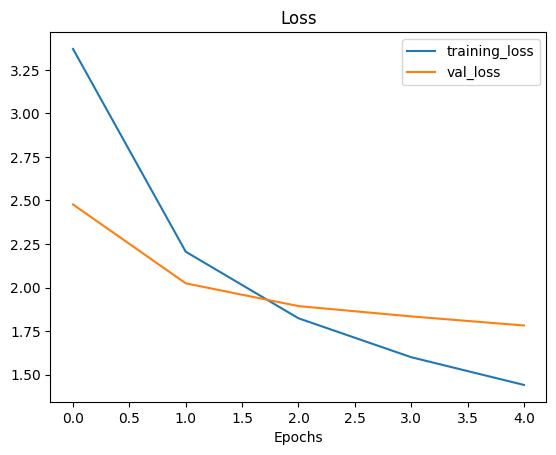

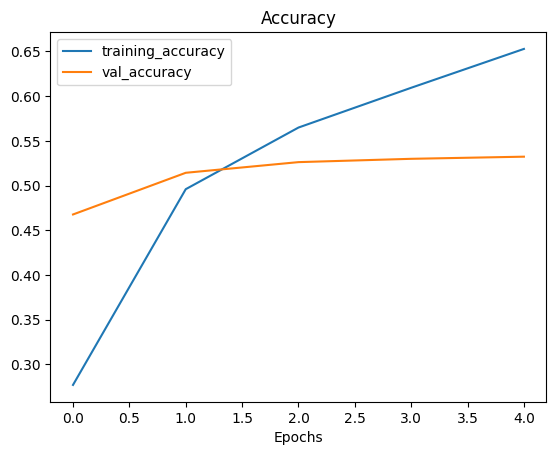

In [13]:
plot_loss_curves(history_all_classes_10_percent)

It is overtrained!

# Fine-tune

In [14]:
# Unfreeze all layers in base model
base_model.trainable = True

# Refreeze every layer except the last 5
for layer in base_model.layers[:-5]:
    layer.trainable = False

In [15]:
model.compile(loss="categorical_crossentropy",
              optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001), # learning rate lowered by 10x
              metrics=["accuracy"])


In [16]:
for layer in model.layers:
    print(layer.name, layer.trainable)

input_layer True
data_augmentation True
efficientnetb0 True
global_avg_pool_layer True
output_layer True


In [17]:
# Check which layers are trainable in our base model
for layer_number, layer in enumerate(base_model.layers):
    print(layer_number, layer.name, layer.trainable)

0 input_1 False
1 rescaling False
2 normalization False
3 rescaling_1 False
4 stem_conv_pad False
5 stem_conv False
6 stem_bn False
7 stem_activation False
8 block1a_dwconv False
9 block1a_bn False
10 block1a_activation False
11 block1a_se_squeeze False
12 block1a_se_reshape False
13 block1a_se_reduce False
14 block1a_se_expand False
15 block1a_se_excite False
16 block1a_project_conv False
17 block1a_project_bn False
18 block2a_expand_conv False
19 block2a_expand_bn False
20 block2a_expand_activation False
21 block2a_dwconv_pad False
22 block2a_dwconv False
23 block2a_bn False
24 block2a_activation False
25 block2a_se_squeeze False
26 block2a_se_reshape False
27 block2a_se_reduce False
28 block2a_se_expand False
29 block2a_se_excite False
30 block2a_project_conv False
31 block2a_project_bn False
32 block2b_expand_conv False
33 block2b_expand_bn False
34 block2b_expand_activation False
35 block2b_dwconv False
36 block2b_bn False
37 block2b_activation False
38 block2b_se_squeeze False
39

In [18]:
fine_tune_epochs = 10   # model has already done 5 epochs, (this is the total number of epochs we're after (5 + 5))

# Fine-tune our model
history_all_classes_10_percent_fine_tune = model.fit(train_data_all_10_percent,
                                                     epochs=fine_tune_epochs,
                                                     validation_data=test_data,
                                                     validation_steps=int(0.15 * len(test_data)),
                                                     initial_epoch=history_all_classes_10_percent.epoch[-1])

Epoch 5/10
237/237 [==============================] - 223s 873ms/step - loss: 1.2134 - accuracy: 0.6801 - val_loss: 1.7203 - val_accuracy: 0.5442
Epoch 6/10
237/237 [==============================] - 214s 904ms/step - loss: 1.1042 - accuracy: 0.7052 - val_loss: 1.7221 - val_accuracy: 0.5516
Epoch 7/10
237/237 [==============================] - 205s 867ms/step - loss: 1.0200 - accuracy: 0.7217 - val_loss: 1.7537 - val_accuracy: 0.5424
Epoch 8/10
237/237 [==============================] - 183s 773ms/step - loss: 0.9563 - accuracy: 0.7386 - val_loss: 1.7397 - val_accuracy: 0.5485
Epoch 9/10
237/237 [==============================] - 192s 809ms/step - loss: 0.8798 - accuracy: 0.7640 - val_loss: 1.7211 - val_accuracy: 0.5501
Epoch 10/10
237/237 [==============================] - 192s 791ms/step - loss: 0.8218 - accuracy: 0.7798 - val_loss: 1.7145 - val_accuracy: 0.5543


In [19]:
all_classes_10_percent_fine_tune_results = model.evaluate(test_data)
all_classes_10_percent_fine_tune_results

790/790 [==============================] - 123s 156ms/step - loss: 1.5061 - accuracy: 0.6031


[1.506138801574707, 0.6031287312507629]

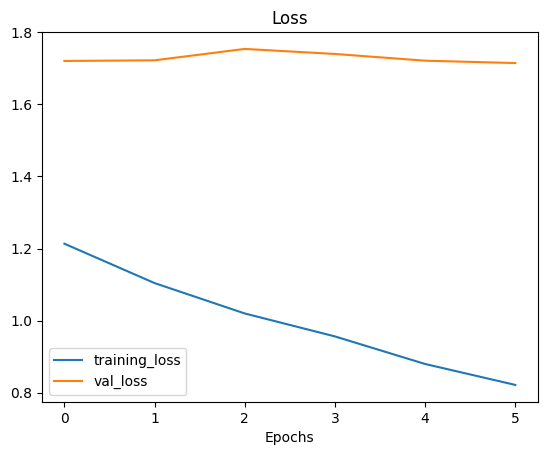

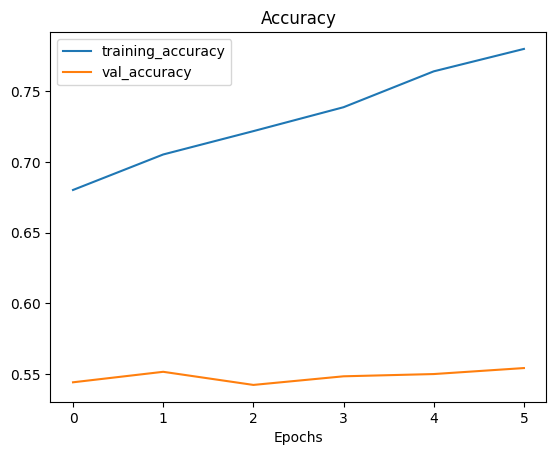

In [20]:
plot_loss_curves(history_all_classes_10_percent_fine_tune)

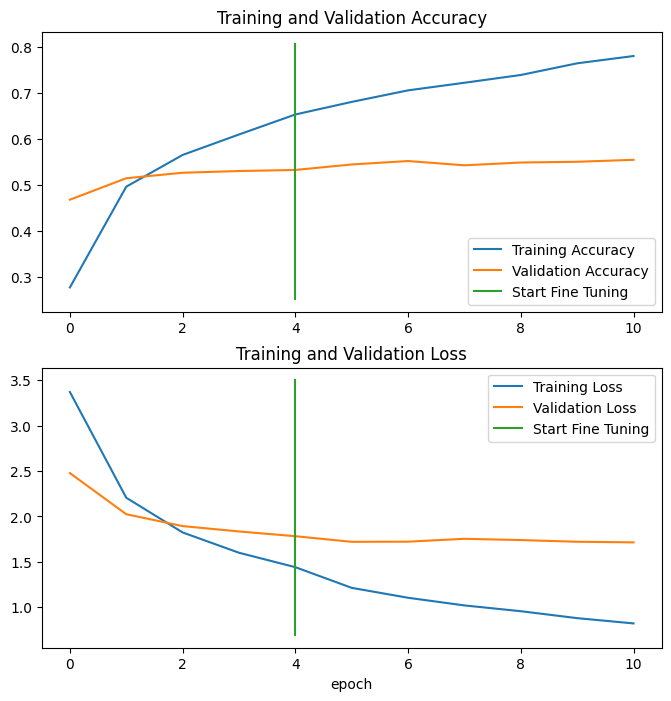

In [21]:
# Compare the histories of feature extraction model with fine-tuning model
compare_historys(original_history=history_all_classes_10_percent,
                 new_history=history_all_classes_10_percent_fine_tune,
                 initial_epochs=5)

## Save and load our model

To use our model in an external application. We need to export it some where

In [22]:
# from google.colab import drive
# drive.mount('/content/drive')

In [23]:
# model.save("/content/drive/MyDrive/Tensorflow/101_food_classes_10_percent_saved_big_dog_model")


In [25]:
# Load and evaluate saved model
# loaded_model = tf.keras.models.load_model("/content/drive/MyDrive/Tensorflow/101_food_classes_10_percent_saved_big_dog_model")

In [ ]:
# Evaluate loaded model and compare performance to pre-saved model
# loaded_model_results = loaded_model.evaluate(test_data)
# loaded_model_results

790/790 [==============================] - 61s 74ms/step - loss: 1.4718 - accuracy: 0.6093


[1.471792221069336, 0.6093465089797974]

In [ ]:
# all_classes_10_percent_fine_tune_results

[1.471792221069336, 0.6093465089797974]

## Evaluating the performance of the big dog model across all different classes

Let's make some predictions, visualize them and then later find out which predictions were the "most" wrong

In [26]:
import tensorflow as tf
!wget https://storage.googleapis.com/ztm_tf_course/food_vision/06_101_food_class_10_percent_saved_big_dog_model.zip



--2024-07-15 14:32:45--  https://storage.googleapis.com/ztm_tf_course/food_vision/06_101_food_class_10_percent_saved_big_dog_model.zip
Resolving storage.googleapis.com (storage.googleapis.com)... 2404:6800:4009:829::201b, 2404:6800:4009:82a::201b, 2404:6800:4009:831::201b, ...
Connecting to storage.googleapis.com (storage.googleapis.com)|2404:6800:4009:829::201b|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 46760742 (45M) [application/zip]
Saving to: '06_101_food_class_10_percent_saved_big_dog_model.zip'

     0K .......... .......... .......... .......... ..........  0%  112K 6m46s
    50K .......... .......... .......... .......... ..........  0%  171K 5m37s
   100K .......... .......... .......... .......... ..........  0%  431K 4m19s
   150K .......... .......... .......... .......... ..........  0%  447K 3m40s
   200K .......... .......... .......... .......... ..........  0%  519K 3m13s
   250K .......... .......... .......... .......... ..........  0%

In [28]:
# Load in pre trained model so that all predictions are similar
unzip_data("C:/Tensorflow/Section 6 Transfer Learning Part 3 Scaling up/06_101_food_class_10_percent_saved_big_dog_model.zip")


In [30]:
# Load in model
model = tf.keras.models.load_model("C:/Tensorflow/Section 6 Transfer Learning Part 3 Scaling up/06_101_food_class_10_percent_saved_big_dog_model")

In [31]:
# Evaluate loaded model
results_downloaded_model = model.evaluate(test_data)
results_downloaded_model

790/790 [==============================] - 139s 172ms/step - loss: 1.8027 - accuracy: 0.6078


[1.8027206659317017, 0.6077623963356018]

## Making predictions with our trained model

In [32]:
# Make predictions with model
preds_probs = model.predict(test_data, verbose=1)

790/790 [==============================] - 116s 143ms/step


In [33]:
len(test_data)

790

In [34]:
len(preds_probs)

25250

In [35]:
preds_probs.shape

(25250, 101)

In [36]:
# Let's see what the first 10 predictions look like
preds_probs[:10]

array([[5.9541881e-02, 3.5742059e-06, 4.1376770e-02, ..., 1.4138657e-09,
        8.3530613e-05, 3.0897388e-03],
       [9.6401680e-01, 1.3753169e-09, 8.4780296e-04, ..., 5.4287048e-05,
        7.8361753e-12, 9.8465647e-10],
       [9.5925868e-01, 3.2533713e-05, 1.4866919e-03, ..., 7.1891270e-07,
        5.4397577e-07, 4.0276042e-05],
       ...,
       [4.7313249e-01, 1.2931154e-07, 1.4805533e-03, ..., 5.9750088e-04,
        6.6969078e-05, 2.3469293e-05],
       [4.4571914e-02, 4.7265402e-07, 1.2258498e-01, ..., 6.3498701e-06,
        7.5318603e-06, 3.6778809e-03],
       [7.2438973e-01, 1.9249848e-09, 5.2311148e-05, ..., 1.2291404e-03,
        1.5792748e-09, 9.6395757e-05]], dtype=float32)

In [37]:
preds_probs[0], len(preds_probs[0]), sum(preds_probs[0])

(array([5.9541881e-02, 3.5742059e-06, 4.1376770e-02, 1.0660537e-09,
        8.1614147e-09, 8.6639513e-09, 8.0926606e-07, 8.5652277e-07,
        1.9859041e-05, 8.0977554e-07, 3.1727692e-09, 9.8673763e-07,
        2.8532126e-04, 7.8048773e-10, 7.4229861e-04, 3.8916241e-05,
        6.4740261e-06, 2.4977169e-06, 3.7891179e-05, 2.0678213e-07,
        1.5538411e-05, 8.1507051e-07, 2.6230423e-06, 2.0010653e-07,
        8.3827234e-07, 5.4215743e-06, 3.7390901e-06, 1.3150512e-08,
        2.7761371e-03, 2.8051763e-05, 6.8562173e-10, 2.5574862e-05,
        1.6688902e-04, 7.6406731e-10, 4.0452636e-04, 1.3150637e-08,
        1.7957331e-06, 1.4448179e-06, 2.3062963e-02, 8.2466721e-07,
        8.5365394e-07, 1.7138567e-06, 7.0524784e-06, 1.8402172e-08,
        2.8553436e-07, 7.9483170e-06, 2.0681500e-06, 1.8525157e-07,
        3.3619521e-08, 3.1522490e-04, 1.0410906e-05, 8.5448306e-07,
        8.4741890e-01, 1.0555408e-05, 4.4094719e-07, 3.7404046e-05,
        3.5306137e-05, 3.2488955e-05, 6.7314628e

Our model outputs a prediction probability array (with N number of variables, where N is the number of classes) for each samples passed to the predict method

In [38]:
# We get one prediction probability per class
print(f"Number of prediction probabilities for sample 0: {len(preds_probs[0])}")
print(f"what prediction probability sample 0 looks like: \n {preds_probs[0]}")
print(f"The class with the highest predicted probability by the model for sample 0: {preds_probs[0].argmax()}")

Number of prediction probabilities for sample 0: 101
what prediction probability sample 0 looks like: 
 [5.9541881e-02 3.5742059e-06 4.1376770e-02 1.0660537e-09 8.1614147e-09
 8.6639513e-09 8.0926606e-07 8.5652277e-07 1.9859041e-05 8.0977554e-07
 3.1727692e-09 9.8673763e-07 2.8532126e-04 7.8048773e-10 7.4229861e-04
 3.8916241e-05 6.4740261e-06 2.4977169e-06 3.7891179e-05 2.0678213e-07
 1.5538411e-05 8.1507051e-07 2.6230423e-06 2.0010653e-07 8.3827234e-07
 5.4215743e-06 3.7390901e-06 1.3150512e-08 2.7761371e-03 2.8051763e-05
 6.8562173e-10 2.5574862e-05 1.6688902e-04 7.6406731e-10 4.0452636e-04
 1.3150637e-08 1.7957331e-06 1.4448179e-06 2.3062963e-02 8.2466721e-07
 8.5365394e-07 1.7138567e-06 7.0524784e-06 1.8402172e-08 2.8553436e-07
 7.9483170e-06 2.0681500e-06 1.8525157e-07 3.3619521e-08 3.1522490e-04
 1.0410906e-05 8.5448306e-07 8.4741890e-01 1.0555408e-05 4.4094719e-07
 3.7404046e-05 3.5306137e-05 3.2488955e-05 6.7314628e-05 1.2852521e-08
 2.6219565e-10 1.0318053e-05 8.5743894e-05 1

In [39]:
# Get the pred classses of each label
pred_classes = preds_probs.argmax(axis=1)

# How do they look?
pred_classes[:10]

array([52,  0,  0, 80, 79, 61, 29,  0, 85,  0], dtype=int64)

In [40]:
# total pred classes
len(pred_classes)

25250

Now we've get a predictins array of all of our model's predictions, to evaluate them, we need to compare them to the original test dataset labels

In [41]:
# To get our test labels we need to unravel our test_data BatchDataset
y_labels = []
for images, labels in test_data.unbatch():
  y_labels.append(labels.numpy().argmax())  # Currently test labels look like [0, 0, 0, 1, ... 0, 0], we want to index value where the "1" occurs
y_labels[:10] # Look at first 10


[0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

In [42]:
# How many y_labels are there?
len(y_labels)

25250

# Evaluating our model's predictions

One way to check that our model's predictions array is in the same order as our test labels array is to find the accuracy score

In [43]:
results_downloaded_model

[1.8027206659317017, 0.6077623963356018]

In [44]:
from sklearn.metrics import accuracy_score
sklearn_accuracy = accuracy_score(y_true = y_labels,
                                  y_pred = pred_classes)

sklearn_accuracy

0.6077623762376237

In [45]:
import numpy as np
np.isclose(results_downloaded_model[1], sklearn_accuracy)

True

# Making a confusion matrix

In [46]:
# Get a list of class names
class_names = test_data.class_names
class_names[:10]

['apple_pie',
 'baby_back_ribs',
 'baklava',
 'beef_carpaccio',
 'beef_tartare',
 'beet_salad',
 'beignets',
 'bibimbap',
 'bread_pudding',
 'breakfast_burrito']

In [47]:
from helper_functions import make_confusion_matrix
make_confusion_matrix(y_true = y_labels,
                      y_pred=pred_classes,
                      classes=class_names,
                      figsize=(100, 100),
                      text_size=20)

In [48]:
import itertools
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import confusion_matrix

# We need to make some changes to our make_confusion_matrix function

def make_confusion_matrix(y_true, y_pred, classes=None, figsize=(10, 10), text_size=15, norm=False, savefig=False):
  """Makes a labelled confusion matrix comparing predictions and ground truth labels.

  If classes is passed, confusion matrix will be labelled, if not, integer class values
  will be used.

  Args:
    y_true: Array of truth labels (must be same shape as y_pred).
    y_pred: Array of predicted labels (must be same shape as y_true).
    classes: Array of class labels (e.g. string form). If `None`, integer labels are used.
    figsize: Size of output figure (default=(10, 10)).
    text_size: Size of output figure text (default=15).
    norm: normalize values or not (default=False).
    savefig: save confusion matrix to file (default=False).

  Returns:
    A labelled confusion matrix plot comparing y_true and y_pred.

  Example usage:
    make_confusion_matrix(y_true=test_labels, # ground truth test labels
                          y_pred=y_preds, # predicted labels
                          classes=class_names, # array of class label names
                          figsize=(15, 15),
                          text_size=10)
  """
  # Create the confustion matrix
  cm = confusion_matrix(y_true, y_pred)
  cm_norm = cm.astype("float") / cm.sum(axis=1)[:, np.newaxis] # normalize it
  n_classes = cm.shape[0] # find the number of classes we're dealing with

  # Plot the figure and make it pretty
  fig, ax = plt.subplots(figsize=figsize)
  cax = ax.matshow(cm, cmap=plt.cm.Blues) # colors will represent how 'correct' a class is, darker == better
  fig.colorbar(cax)

  # Are there a list of classes?
  if classes:
    labels = classes
  else:
    labels = np.arange(cm.shape[0])

  # Label the axes
  ax.set(title="Confusion Matrix",
         xlabel="Predicted label",
         ylabel="True label",
         xticks=np.arange(n_classes), # create enough axis slots for each class
         yticks=np.arange(n_classes),
         xticklabels=labels, # axes will labeled with class names (if they exist) or ints
         yticklabels=labels)

  # Make x-axis labels appear on bottom
  ax.xaxis.set_label_position("bottom")
  ax.xaxis.tick_bottom()

  ### Changed (plot x-labels vertically) ###
  plt.xticks(rotation=70, fontsize=text_size)
  plt.yticks(fontsize=text_size)

  # Set the threshold for different colors
  threshold = (cm.max() + cm.min()) / 2.

  # Plot the text on each cell
  for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
    if norm:
      plt.text(j, i, f"{cm[i, j]} ({cm_norm[i, j]*100:.1f}%)",
              horizontalalignment="center",
              color="white" if cm[i, j] > threshold else "black",
              size=text_size)
    else:
      plt.text(j, i, f"{cm[i, j]}",
              horizontalalignment="center",
              color="white" if cm[i, j] > threshold else "black",
              size=text_size)

  # Save the figure to the current working directory
  if savefig:
    fig.savefig("confusion_matrix.png")

# Make a function to predict on images and plot them (works with multi-class)

In [49]:
make_confusion_matrix(y_true = y_labels,
                      y_pred=pred_classes,
                      classes=class_names,
                      figsize=(100, 100),
                      text_size=20,
                      savefig=True)

In [50]:
from sklearn.metrics import classification_report
print(classification_report(y_true=y_labels,
                            y_pred=pred_classes))

              precision    recall  f1-score   support

           0       0.29      0.20      0.24       250
           1       0.51      0.69      0.59       250
           2       0.56      0.65      0.60       250
           3       0.74      0.53      0.62       250
           4       0.73      0.43      0.54       250
           5       0.34      0.54      0.42       250
           6       0.67      0.79      0.72       250
           7       0.82      0.76      0.79       250
           8       0.40      0.37      0.39       250
           9       0.62      0.44      0.51       250
          10       0.62      0.42      0.50       250
          11       0.84      0.49      0.62       250
          12       0.52      0.74      0.61       250
          13       0.56      0.60      0.58       250
          14       0.56      0.59      0.57       250
          15       0.44      0.32      0.37       250
          16       0.45      0.75      0.57       250
          17       0.37    

The numbers above give a great class by class evaluation of our model's predictions but with so many classes, they're quite hard to understand

How about we create a visualization to get a better understanding


In [51]:
# Get a dictionary of classification report
classification_report_dict = classification_report(y_labels, pred_classes, output_dict=True)
classification_report_dict

{'0': {'precision': 0.29310344827586204,
  'recall': 0.204,
  'f1-score': 0.24056603773584906,
  'support': 250.0},
 '1': {'precision': 0.5088235294117647,
  'recall': 0.692,
  'f1-score': 0.5864406779661017,
  'support': 250.0},
 '2': {'precision': 0.5625,
  'recall': 0.648,
  'f1-score': 0.6022304832713755,
  'support': 250.0},
 '3': {'precision': 0.7415730337078652,
  'recall': 0.528,
  'f1-score': 0.616822429906542,
  'support': 250.0},
 '4': {'precision': 0.7346938775510204,
  'recall': 0.432,
  'f1-score': 0.5440806045340051,
  'support': 250.0},
 '5': {'precision': 0.34177215189873417,
  'recall': 0.54,
  'f1-score': 0.4186046511627907,
  'support': 250.0},
 '6': {'precision': 0.6677966101694915,
  'recall': 0.788,
  'f1-score': 0.7229357798165138,
  'support': 250.0},
 '7': {'precision': 0.8197424892703863,
  'recall': 0.764,
  'f1-score': 0.7908902691511387,
  'support': 250.0},
 '8': {'precision': 0.4025974025974026,
  'recall': 0.372,
  'f1-score': 0.3866943866943867,
  'sup

Let's plot our classes F1-scores

In [52]:
classification_report_dict["99"]["f1-score"]

0.35356200527704484

In [53]:
# Create empty dictionary
class_f1_scores = {}
# Loop through classification report dictionary items
for k, v in classification_report_dict.items():
  if k == "accuracy": # Stop once we get to accuracy key
    break
  else:
    # Add a class names and f1 scores to new dictionary
    class_f1_scores[class_names[int(k)]] = v["f1-score"]
class_f1_scores

{'apple_pie': 0.24056603773584906,
 'baby_back_ribs': 0.5864406779661017,
 'baklava': 0.6022304832713755,
 'beef_carpaccio': 0.616822429906542,
 'beef_tartare': 0.5440806045340051,
 'beet_salad': 0.4186046511627907,
 'beignets': 0.7229357798165138,
 'bibimbap': 0.7908902691511387,
 'bread_pudding': 0.3866943866943867,
 'breakfast_burrito': 0.5117370892018779,
 'bruschetta': 0.5047619047619047,
 'caesar_salad': 0.6161616161616161,
 'cannoli': 0.6105610561056105,
 'caprese_salad': 0.5775193798449613,
 'carrot_cake': 0.574757281553398,
 'ceviche': 0.3674418604651163,
 'cheese_plate': 0.5654135338345865,
 'cheesecake': 0.42546063651591287,
 'chicken_curry': 0.5008403361344538,
 'chicken_quesadilla': 0.6411889596602972,
 'chicken_wings': 0.7123809523809523,
 'chocolate_cake': 0.4526166902404526,
 'chocolate_mousse': 0.3291592128801431,
 'churros': 0.7134935304990758,
 'clam_chowder': 0.7708779443254818,
 'club_sandwich': 0.734020618556701,
 'crab_cakes': 0.46255506607929514,
 'creme_brulee'

In [54]:
# Turn f1-scores into dataframe for visualization
import pandas as pd
f1_scores = pd.DataFrame({"class_names": list(class_f1_scores.keys()),
                          "f1-score": list(class_f1_scores.values())}).sort_values("f1-score", ascending=False)

In [55]:
f1_scores[:10]

,class_names,f1-score
33,edamame,0.937143
63,macarons,0.895397
75,pho,0.866538
91,spaghetti_carbonara,0.847656
69,oysters,0.834008
68,onion_rings,0.832618
65,mussels,0.820000
88,seaweed_salad,0.813008
64,miso_soup,0.812977
45,frozen_yogurt,0.811429


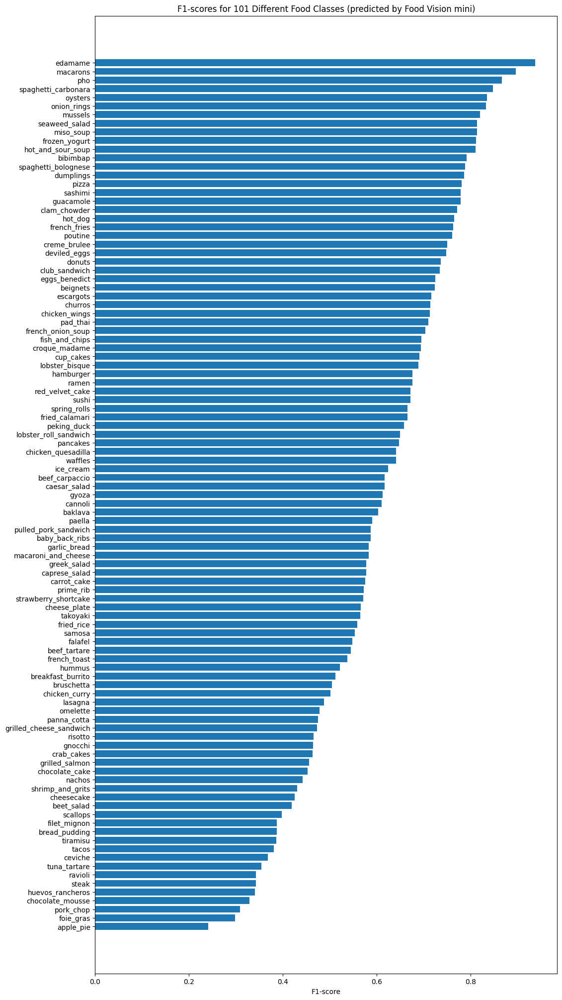

In [56]:
import matplotlib.pyplot as plt

fig, ax = plt.subplots(figsize=(12, 25))
scores = ax.barh(range(len(f1_scores)), f1_scores["f1-score"].values) # Get f1 score values
ax.set_yticks(range(len(f1_scores)))
ax.set_yticklabels(f1_scores["class_names"]);
ax.set_xlabel("F1-score")
ax.set_title("F1-scores for 101 Different Food Classes (predicted by Food Vision mini)")
ax.invert_yaxis();

## Visualizing predictions on custom images

Now, thus is the real test, how does our model go on food images not even in our test dataset (images of our own)

To visualize our model's predictions on our own images, we'll need a function to load and preprocess images, specifically it will need to:
* Read in a target images filepath using tf.io.read_file()
* Turn the images into a Tensor using tf.io.decode_image()
* Resize the images tensor to be the same size as the images our model has trained on using tf.image.resize()
* Scale the image to get all of the pixel values between 0 and 1 (if necessary)

In [57]:
# Create function to load and prepare images
def load_and_pred_image(filename, img_shape=224, scale=True):
  """
  Read in an image from filename, turns it into a tensor and reshapes into
  specified shape(img_shape, img_shape, color_channels=3)

  Args:
    filename (str): path to target image
    image_shape (int): height/width dimension of target image size
    scale(bool): scale pixel values from 0-255 to 0-1 or not

  Returns:
    Image tensor of shape (img_shape, img_shape, 3)
  """
  # Read in the image
  img = tf.io.read_file(filename)

  # Decode image into tensor
  img = tf.io.decode_image(img, channels=3)

  # Resize the image
  img = tf.image.resize(img, [img_shape, img_shape])

  # Scale?
  if scale:
    # rescale the image
    return img/255.
  else:
    return img

Now we can write code to visualize images, their target label and our mode's predictions.

Specifically, we'll write some code to:
1. Load a few random images from the test dataset
2. Make predictions on the loaded images
3. Plot the original image(s) along with the model's predictions, prediction probability and truth label

(224, 224, 3)
1/1 [==============================] - 0s 57ms/step
(224, 224, 3)
1/1 [==============================] - 0s 75ms/step
(224, 224, 3)
1/1 [==============================] - 0s 61ms/step


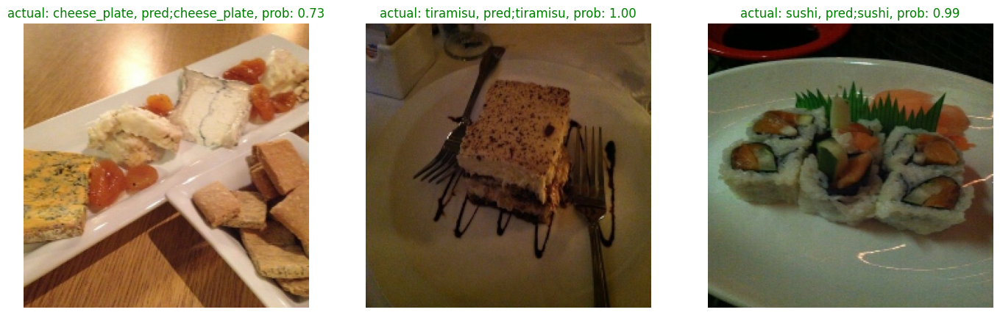

In [77]:
import os
import random

plt.figure(figsize=(17, 10))
for i in range(3):
  class_name = random.choice(class_names)
  filename = random.choice(os.listdir(test_dir + "/" + class_name))
  filepath = test_dir + class_name + "/" + filename

  # Load the image and make predictions
  img = load_and_pred_image(filepath, scale=False)
  print(img.shape)
  img_expanded = tf.expand_dims(img, axis=0)
  # print(img_expanded.shape)
  pred_prob = model.predict(img_expanded)
  pred_class = class_names[pred_prob.argmax()]

  # print(pred_prob)
  # print(pred_class)

  # Plot the images
  plt.subplot(1, 3, i+1)
  plt.imshow(img/255.)
  if class_name == pred_class:  # if predicted class matches truth class, make text green
    title_color = "g"
  else:
    title_color = "r"
  plt.title(f"actual: {class_name}, pred;{pred_class}, prob: {pred_prob.max():.2f}", c=title_color)
  plt.axis(False)

## Finding the most wrong predictions

To find our where our model is most wrong, let's write some code to find out the following:
1. Get all of the images file paths in the test dataset using list_files() method
2. Create a pandas DataFrame of the image filepaths, ground truth labels, predicted classes (from our model), max prediction probabilities, prediction class names, ground truth class names.
3. Use our DataFrame to find all the wrong predictions (wjere the ground truth label dosen't match the prediction)
4. Sort the DataFrame based on wrong predictions (have the highest predictin probability predictions at the top)
5. Visualize the images with the highest prediction probabilities but have the wrong prediction.

In [79]:
# 1. Get all of the image file paths in the test dataset
filepaths = []
for filepath in test_data.list_files("C:/Tensorflow/Section 6 Transfer Learning Part 3 Scaling up/101_food_classes_10_percent/test/*/*.jpg",
                                     shuffle=False):
    filepaths.append(filepath.numpy())
filepaths[:10]


[b'C:\\Tensorflow\\Section 6 Transfer Learning Part 3 Scaling up\\101_food_classes_10_percent\\test\\apple_pie\\1011328.jpg',
 b'C:\\Tensorflow\\Section 6 Transfer Learning Part 3 Scaling up\\101_food_classes_10_percent\\test\\apple_pie\\101251.jpg',
 b'C:\\Tensorflow\\Section 6 Transfer Learning Part 3 Scaling up\\101_food_classes_10_percent\\test\\apple_pie\\1034399.jpg',
 b'C:\\Tensorflow\\Section 6 Transfer Learning Part 3 Scaling up\\101_food_classes_10_percent\\test\\apple_pie\\103801.jpg',
 b'C:\\Tensorflow\\Section 6 Transfer Learning Part 3 Scaling up\\101_food_classes_10_percent\\test\\apple_pie\\1038694.jpg',
 b'C:\\Tensorflow\\Section 6 Transfer Learning Part 3 Scaling up\\101_food_classes_10_percent\\test\\apple_pie\\1047447.jpg',
 b'C:\\Tensorflow\\Section 6 Transfer Learning Part 3 Scaling up\\101_food_classes_10_percent\\test\\apple_pie\\1068632.jpg',
 b'C:\\Tensorflow\\Section 6 Transfer Learning Part 3 Scaling up\\101_food_classes_10_percent\\test\\apple_pie\\110043.j

In [89]:
# 2. Create a DataFrame of different parameters for each of our test images
import pandas as pd
pred_df = pd.DataFrame({"img_path": filepaths,
                        "y_true": y_labels,
                        "y_pred": pred_classes,
                        "pred_conf": preds_probs.max(axis=1), # get the maximum prediction probability value
                        "y_true_classname": [class_names[i] for i in y_labels],
                        "y_pred_classname": [class_names[i] for i in pred_classes]}) 
pred_df.head()

,img_path,y_true,y_pred,pred_conf,y_true_classname,y_pred_classname
0,b'C:\\Tensorflow\\Section 6 Transfer Learning ...,0,52,0.847419,apple_pie,gyoza
1,b'C:\\Tensorflow\\Section 6 Transfer Learning ...,0,0,0.964017,apple_pie,apple_pie
2,b'C:\\Tensorflow\\Section 6 Transfer Learning ...,0,0,0.959259,apple_pie,apple_pie
3,b'C:\\Tensorflow\\Section 6 Transfer Learning ...,0,80,0.658607,apple_pie,pulled_pork_sandwich
4,b'C:\\Tensorflow\\Section 6 Transfer Learning ...,0,79,0.367900,apple_pie,prime_rib


In [90]:
# 3. Find out in our DataFrame which predictions are wrong
pred_df["pred_correct"] = pred_df["y_true"] == pred_df["y_pred"]
pred_df.head()

,img_path,y_true,y_pred,pred_conf,y_true_classname,y_pred_classname,pred_correct
0,b'C:\\Tensorflow\\Section 6 Transfer Learning ...,0,52,0.847419,apple_pie,gyoza,False
1,b'C:\\Tensorflow\\Section 6 Transfer Learning ...,0,0,0.964017,apple_pie,apple_pie,True
2,b'C:\\Tensorflow\\Section 6 Transfer Learning ...,0,0,0.959259,apple_pie,apple_pie,True
3,b'C:\\Tensorflow\\Section 6 Transfer Learning ...,0,80,0.658607,apple_pie,pulled_pork_sandwich,False
4,b'C:\\Tensorflow\\Section 6 Transfer Learning ...,0,79,0.367900,apple_pie,prime_rib,False


In [92]:
# 4. Sort our DataFrame to have most wrong predictions at the top
top_100_wrong = pred_df[pred_df["pred_correct"] == False].sort_values("pred_conf", ascending=False)[:100]
top_100_wrong.head(20)

,img_path,y_true,y_pred,pred_conf,y_true_classname,y_pred_classname,pred_correct
21810,b'C:\\Tensorflow\\Section 6 Transfer Learning ...,87,29,0.999997,scallops,cup_cakes,False
231,b'C:\\Tensorflow\\Section 6 Transfer Learning ...,0,100,0.999995,apple_pie,waffles,False
15359,b'C:\\Tensorflow\\Section 6 Transfer Learning ...,61,53,0.999988,lobster_roll_sandwich,hamburger,False
23539,b'C:\\Tensorflow\\Section 6 Transfer Learning ...,94,83,0.999987,strawberry_shortcake,red_velvet_cake,False
21400,b'C:\\Tensorflow\\Section 6 Transfer Learning ...,85,92,0.999981,samosa,spring_rolls,False
24540,b'C:\\Tensorflow\\Section 6 Transfer Learning ...,98,83,0.999947,tiramisu,red_velvet_cake,False
2511,b'C:\\Tensorflow\\Section 6 Transfer Learning ...,10,61,0.999945,bruschetta,lobster_roll_sandwich,False
5574,b'C:\\Tensorflow\\Section 6 Transfer Learning ...,22,21,0.999939,chocolate_mousse,chocolate_cake,False
17855,b'C:\\Tensorflow\\Section 6 Transfer Learning ...,71,65,0.999931,paella,mussels,False
23797,b'C:\\Tensorflow\\Section 6 Transfer Learning ...,95,86,0.999904,sushi,sashimi,False


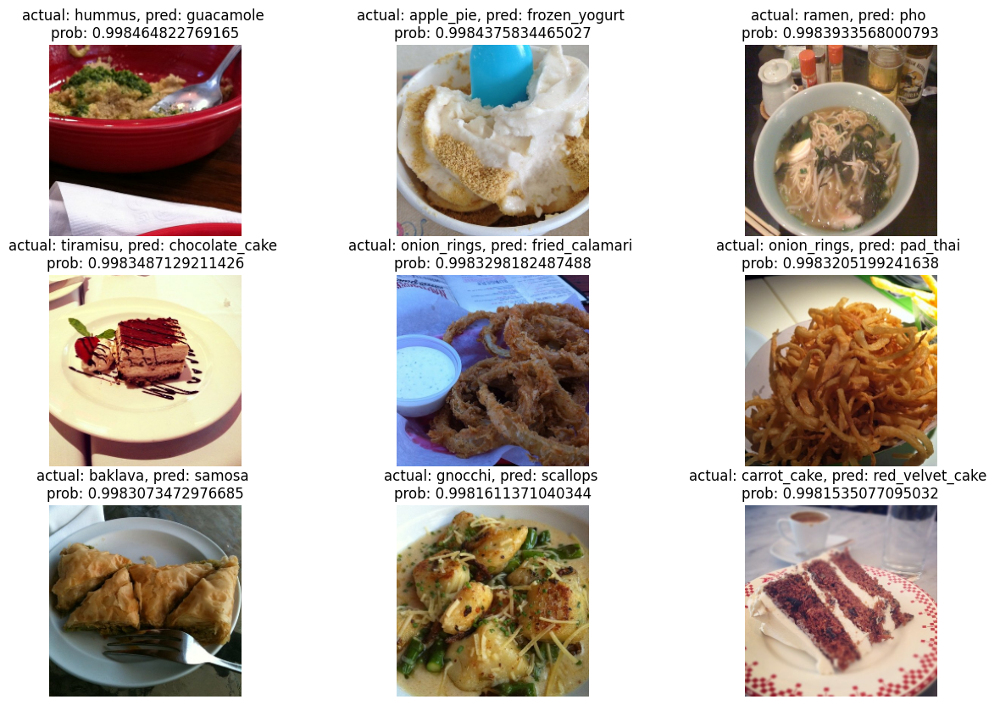

In [103]:
# 5. Visualize the test data samples which have the wrong prediction but highest pred probability
images_to_view = 9
start_index = 56
plt.figure(figsize=(15, 10))
for i, row in enumerate(top_100_wrong[start_index:start_index+images_to_view].itertuples()):
    plt.subplot(3, 3, i+1)
    # print(row)
    img = load_and_pred_image(row[1], scale=False)
    _, _, _, _, pred_prob, y_true_classname, y_pred_classname, _ = row # Only interest in a few parameters of each row
    plt.imshow(img/255.)
    plt.title(f"actual: {y_true_classname}, pred: {y_pred_classname} \nprob: {pred_prob}")
    plt.axis(False)



In [104]:
# Test our model on our own custom images
!wget https://storage.googleapis.com/ztm_tf_course/food_vision/custom_food_images.zip

unzip_data("custom_food_images.zip")

--2024-07-15 16:07:59--  https://storage.googleapis.com/ztm_tf_course/food_vision/custom_food_images.zip
Resolving storage.googleapis.com (storage.googleapis.com)... 2404:6800:4009:82d::201b, 2404:6800:4009:82e::201b, 2404:6800:4009:832::201b, ...
Connecting to storage.googleapis.com (storage.googleapis.com)|2404:6800:4009:82d::201b|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 13192985 (13M) [application/zip]
Saving to: 'custom_food_images.zip'

     0K .......... .......... .......... .......... ..........  0%  127K 1m41s
    50K .......... .......... .......... .......... ..........  0%  175K 87s
   100K .......... .......... .......... .......... ..........  1%  476K 67s
   150K .......... .......... .......... .......... ..........  1%  455K 57s
   200K .......... .......... .......... .......... ..........  1%  524K 50s
   250K .......... .......... .......... .......... ..........  2%  720K 44s
   300K .......... .......... .......... .......... .....

In [107]:
# Get the custom food images filepaths
custom_food_images = ["custom_food_images/" + img_path for img_path in os.listdir("custom_food_images")]
custom_food_images

['custom_food_images/chicken_wings.jpeg',
 'custom_food_images/chocolate_cake.jpg',
 'custom_food_images/hamburger.jpeg',
 'custom_food_images/pizza-dad.jpeg',
 'custom_food_images/ramen.jpeg',
 'custom_food_images/steak.jpeg',
 'custom_food_images/sushi.jpeg']

1/1 [==============================] - 0s 48ms/step


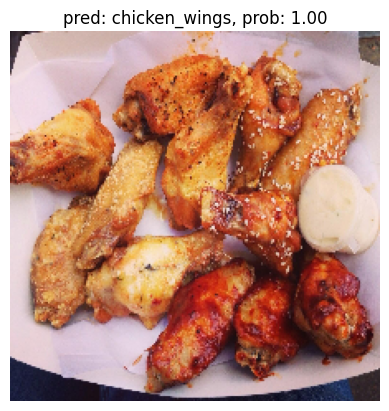

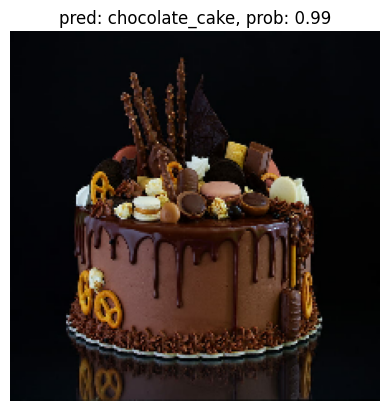

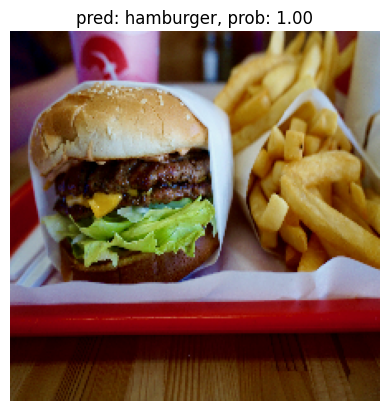

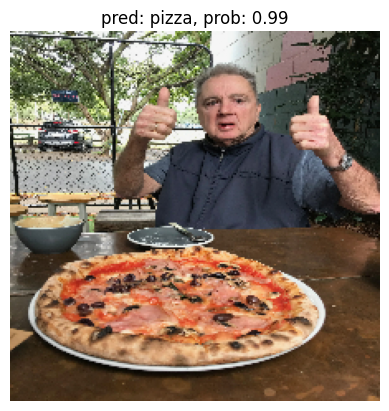

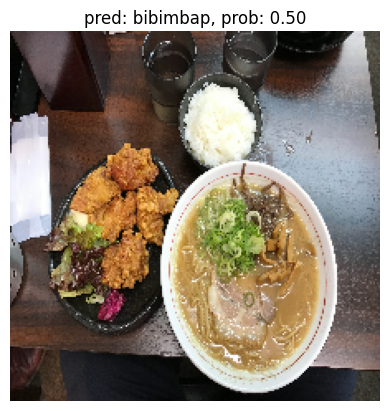

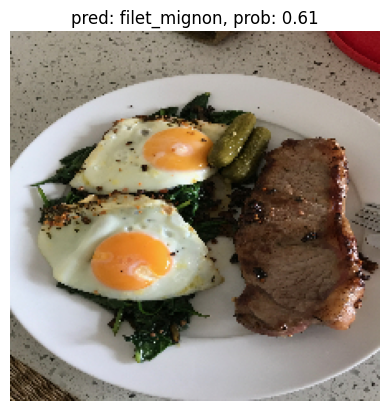

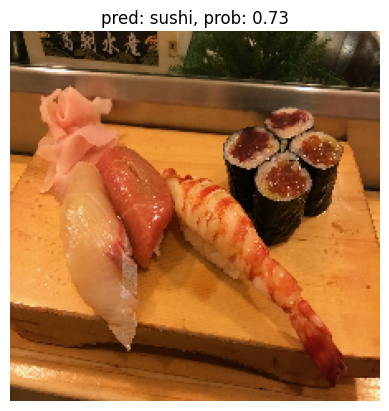

In [108]:
# Make predictions on and plot custom food images
for img in custom_food_images:
    img = load_and_pred_image(img, scale=False) # Dont need to scale foe efficientNet model
    pred_prob = model.predict(tf.expand_dims(img, axis=0))
    pred_class = class_names[pred_prob.argmax()]    # Get the index with the highest prediction probability
    # Plot the appropriate information
    plt.figure()
    plt.imshow(img/255.)
    plt.title(f"pred: {pred_class}, prob: {pred_prob.max():.2f}")
    plt.axis(False)